### Load Sentiment Data

In [ ]:
sentiment_file_path = '/content/20260504 - Data Sentimen.xlsx'

In [ ]:
sentiment_df = pd.read_excel(sentiment_file_path)
sentiment_df['Tanggal'] = pd.to_datetime(sentiment_df['Tanggal'])

In [ ]:
sentiment_df

,Tanggal,Saham,Sentiment_Score,Headline
0,2026-04-01,Adaro Andalan Indonesia,-0.190900,No News
1,2026-03-31,Adaro Andalan Indonesia,-0.190900,"IHSG Siang Ini Turun 0,53% ke 7.053, HEAL, AAD..."
2,2026-03-30,Adaro Andalan Indonesia,-0.025800,No News
3,2026-03-27,Adaro Andalan Indonesia,-0.226300,IHSG Jumat (27/3) Diproyeksi Bergerak Terbatas...
4,2026-03-26,Adaro Andalan Indonesia,0.296000,"Net Buy Rp103,12 Miliar, Asing Incar Saham-sah..."
...,...,...,...,...
73043,2020-03-06,Unilever Indonesia,0.418400,No News
73044,2020-03-05,Unilever Indonesia,0.418400,"Corona Oh Corona! Gara-Gara Corona, Dividen da..."
73045,2020-03-04,Unilever Indonesia,0.273025,No News
73046,2020-03-03,Unilever Indonesia,0.273025,"Asing Belum Nyaman Investasi di Indonesia, Sah..."


In [ ]:
zero_sentiment_no_news = sentiment_df[(sentiment_df['Headline'] == 'No News') & (sentiment_df['Sentiment_Score'] == 0)]
zero_sentiment_no_news_counts = zero_sentiment_no_news.groupby('Saham').size().rename('Zero Sentiment No News Count')
total_counts = sentiment_df.groupby('Saham').size().rename('Total Count')

no_news_counts = sentiment_df[sentiment_df['Headline'] == 'No News'].groupby('Saham').size().rename('No News Count')

percentage_zero_sentiment_no_news = (zero_sentiment_no_news_counts / no_news_counts * 100).fillna(0).round(2)

combined_zero_sentiment_df = pd.DataFrame({
    'Zero Sentiment': zero_sentiment_no_news_counts,
    'Total': total_counts,
    'Percentage (%)': percentage_zero_sentiment_no_news
})

display(combined_zero_sentiment_df)

,Zero Sentiment,Total,Percentage (%)
Saham,,,
Adaro Andalan Indonesia,1363,1588,88.56
Akr Corporindo,241,1588,16.55
Alamtri Minerals Indonesia,639,1588,43.50
Alamtri Resources Indonesia Tbk PT,167,1588,14.87
Amman Mineral Internasional Tbk PT,1145,1588,78.75
Aneka Tambang Persero,159,1588,24.02
Astra International,245,1588,30.63
Bank Central Asia,97,1588,19.25
Bank Mandiri Persero,117,1588,24.07


In [ ]:
def create_features(data):

    close = data['Close'].to_numpy().flatten()
    high  = data['High'].to_numpy().flatten()
    low   = data['Low'].to_numpy().flatten()

    # Technical Indicators
    periods = [21, 75, 150]

    for p in periods:
        data[f'SMA{p}']  = talib.SMA(close, timeperiod=p)
        data[f'EMA{p}']  = talib.EMA(close, timeperiod=p)
        data[f'DEMA{p}'] = talib.DEMA(close, timeperiod=p)
        data[f'TEMA{p}'] = talib.TEMA(close, timeperiod=p)
        data[f'KAMA{p}'] = talib.KAMA(close, timeperiod=p)

    data['RSI'] = talib.RSI(close, timeperiod=21)
    data['Momentum'] = talib.MOM(close, timeperiod=21)

    # Simple Returns

    for col in ['Close','Open','High','Low']:
        data[f'{col}R'] = data[col] / data[col].shift(-1)

    return data

In [ ]:
def create_target(data, look_ahead=15):

    data['TargetReturn'] = np.log(data['Close'].shift(-look_ahead) / data['Close'])

    return data

In [ ]:
def select_features(data, target_col='TargetReturn', top_n=15):

    numeric_data = data.select_dtypes(include=[np.number])
    corr = numeric_data.corr()[target_col].drop(target_col)
    selected = corr.abs().sort_values(ascending=False).head(top_n).index.tolist()

    print("Selected Features:")
    for f in selected:
        print(f, corr[f])

    return selected

In [ ]:
def create_sequences(X, y, lookback=15):

    X_seq = []
    y_seq = []

    for i in range(lookback, len(X)):
        X_seq.append(X[i-lookback:i])
        y_seq.append(y[i])

    return np.array(X_seq), np.array(y_seq)

In [ ]:
stock_name_map = {
    'AADI.JK': 'Adaro Andalan Indonesia',
    'ADMR.JK': 'Alamtri Minerals Indonesia',
    'ADRO.JK': 'Alamtri Resources Indonesia Tbk PT',
    'AKRA.JK': 'Akr Corporindo',
    'AMMN.JK': 'Amman Mineral Internasional Tbk PT',
    'AMRT.JK': 'Sumber Alfaria Trijaya',
    'ANTM.JK': 'Aneka Tambang Persero',
    'ASII.JK': 'Astra International',
    'BBCA.JK': 'Bank Central Asia',
    'BBNI.JK': 'Bank Negar',
    'BBRI.JK': 'Bank Rakyat Persero',
    'BBTN.JK': 'Bank Tabungan Negara',
    'BMRI.JK': 'Bank Mandiri Persero',
    'BREN.JK': 'Barito Renewables Energy PT Tbk',
    'BRPT.JK': 'Barito Pacific',
    'BUMI.JK': 'Bumi Resources',
    'CPIN.JK': 'Charoen Pokphand Indonesia',
    'CTRA.JK': 'Ciputra Dev',
    'DSSA.JK': 'Dian Swastatika',
    'EMTK.JK': 'Elang Mahkota',
    'EXCL.JK': 'XL Axiata',
    'GOTO.JK': 'GoTo Gojek Tokopedia PT',
    'HEAL.JK': 'Medikaloka Hermina',
    'ICBP.JK': 'Indofood Cbp',
    'INCO.JK': 'Vale Indonesia',
    'INDF.JK': 'Indofood',
    'INKP.JK': 'Indah Kiat Pulp & Paper',
    'ISAT.JK': 'Indosat',
    'ITMG.JK': 'Indo Tambangraya',
    'JPFA.JK': 'Japfa Comfeed Indonesia',
    'KLBF.JK': 'Kalbe Farma',
    'MAPI.JK': 'Mitra Adiperkasa',
    'MBMA.JK': 'Merdeka Battery Materials PT',
    'MDKA.JK': 'Merdeka Copper Gold TBK PT',
    'MEDC.JK': 'Medco Energi',
    'NCKL.JK': 'PT Trimegah Bangun Persada Tbk',
    'PGAS.JK': 'Perusahaan Gas Negara',
    'PGEO.JK': 'PT Pertamina Geothermal Energy',
    'PTBA.JK': 'Bukit Asam',
    'SCMA.JK': 'Surya Citra Media',
    'SMGR.JK': 'Semen Indonesia Persero',
    'TLKM.JK': 'Telkom Indonesia',
    'TOWR.JK': 'Sarana Menara Nusantara',
    'UNTR.JK': 'United Tractors',
    'UNVR.JK': 'Unilever Indonesia'
}

def prepare_data(stock, sentiment_data=None, stock_name_map=None):
  data = yf.download(stock, start="2020-03-01",
                     end="2026-03-31",
                     auto_adjust=True)

  if isinstance(data.columns, pd.MultiIndex):
    data.columns = data.columns.get_level_values(0)

  data.drop(['Volume'], axis=1, inplace=True)
  data = data.reset_index()

  if sentiment_data is not None and not sentiment_data.empty and stock_name_map is not None:
    company_name = stock_name_map.get(stock)
    if company_name:
        filtered_sentiment = sentiment_data[sentiment_data['Saham'] == company_name]
        filtered_sentiment = filtered_sentiment.rename(columns={'Tanggal': 'Date'})[['Date', 'Sentiment_Score']]
        data = pd.merge(data, filtered_sentiment, on='Date', how='left')
        data['Sentiment_Score'] = data['Sentiment_Score'].fillna(0)
    else:
        print(f"Warning: No company name mapping found for {stock}. Skipping sentiment merge.")

  data.dropna(inplace=True)

  min_rows_for_talib = 60
  if len(data) < min_rows_for_talib:
    print(f"Warning: Not enough data for {stock} (found {len(data)} rows, need at least {min_rows_for_talib}). Skipping feature creation.")
    return pd.DataFrame(), []

  data = create_features(data)
  data.replace([np.inf, -np.inf], np.nan, inplace=True)
  data.dropna(inplace=True)

  data = create_target(data)
  data.dropna(inplace=True)

  features_to_consider = data.drop(columns=['Date', 'TargetReturn'], errors='ignore').columns.tolist()
  if 'Sentiment_Score' in features_to_consider: # Check if sentiment score is present
      features_list = select_features(data.drop(columns=['Date'], errors='ignore'), target_col='TargetReturn')
      if 'Sentiment_Score' not in features_list:
          features_list.append('Sentiment_Score')
  else:
      features_list = select_features(data.drop(columns=['Date'], errors='ignore'), target_col='TargetReturn')

  data_selected = data[features_list + ['TargetReturn', 'Date']].copy() # Keep 'Date' in data_selected

  return data_selected, features_list

## LSTM

In [ ]:
stocks = ['AADI.JK', 'ADMR.JK', 'ADRO.JK', 'AKRA.JK', 'AMMN.JK',
          'AMRT.JK', 'ANTM.JK', 'ASII.JK', 'BBCA.JK', 'BBNI.JK',
          'BBRI.JK', 'BBTN.JK', 'BMRI.JK', 'BREN.JK', 'BRPT.JK',
          'BUMI.JK', 'CPIN.JK', 'CTRA.JK', 'DSSA.JK', 'EMTK.JK',
          'EXCL.JK', 'GOTO.JK', 'HEAL.JK', 'ICBP.JK', 'INCO.JK',
          'INDF.JK', 'INKP.JK', 'ISAT.JK', 'ITMG.JK', 'JPFA.JK',
          'KLBF.JK', 'MAPI.JK', 'MBMA.JK', 'MDKA.JK', 'MEDC.JK',
          'NCKL.JK', 'PGAS.JK', 'PGEO.JK', 'PTBA.JK', 'SCMA.JK',
          'SMGR.JK', 'TLKM.JK', 'TOWR.JK', 'UNTR.JK', 'UNVR.JK'
          ]

lstm_pred_returns = []
lstm_evaluation_metrics = []
lstm_all_dates_test = {}
lstm_all_y_test_inv = {}
lstm_all_y_pred_inv = {}

for stock in stocks:
    keras.backend.clear_session()

    data_selected, features = prepare_data(stock)

    if not data_selected.empty and features:
        data_selected.dropna(inplace=True);

        final_dates = data_selected['Date'].reset_index(drop=True)

        scaler_X = MinMaxScaler((-1,1))
        scaler_y = MinMaxScaler((-1,1))

        X_scaled = scaler_X.fit_transform(data_selected[features])
        y_scaled = scaler_y.fit_transform(data_selected[['TargetReturn']])

        lookback = 15
        X_seq, y_seq = create_sequences(X_scaled, y_scaled, lookback=lookback)

        dates_for_sequences = final_dates.iloc[lookback:].reset_index(drop=True)

        train_size = int(len(X_seq)*0.8)

        X_train = X_seq[:train_size]
        X_test = X_seq[train_size:]

        y_train = y_seq[:train_size]
        y_test = y_seq[train_size:]

        # Split dates for the test set
        dates_test = dates_for_sequences[train_size:].reset_index(drop=True)

        # LSTM training
        model = Sequential()
        model.add(LSTM(32, return_sequences=True, input_shape=(X_train.shape[1], X_train.shape[2])))
        model.add(LSTM(32))
        model.add(Dense(1))

        es= EarlyStopping(monitor= 'loss', min_delta= 1e-10, patience= 10, verbose= 1)
        rlr= ReduceLROnPlateau(monitor= 'loss', factor= 0.5, patience= 10, verbose= 1)

        model.compile(keras.optimizers.Adam(learning_rate= 0.01), loss= 'mean_squared_error')

        history = model.fit(X_train,
                            y_train,
                            epochs=100,
                            batch_size=32,
                            callbacks= [es, rlr],
                            validation_split=0.2,
                            verbose=1)

        # prediction
        y_pred = model.predict(X_test)
        y_pred_inv = scaler_y.inverse_transform(y_pred)
        y_test_inv = scaler_y.inverse_transform(y_test)

        y_pred_flat = y_pred_inv.flatten()
        y_test_flat = y_test_inv.flatten()

        rmse = np.sqrt(mean_squared_error(y_test_flat, y_pred_flat))
        nmse = mean_squared_error(y_test_flat, y_pred_flat) / np.var(y_test_flat)
        mae = sklearn.metrics.mean_absolute_error(y_test_flat, y_pred_flat)
        r2 = sklearn.metrics.r2_score(y_test_flat, y_pred_flat)

        print(f"\nEvaluation for {stock}")
        print("RMSE :", rmse)
        print("NMSE :", nmse)
        print("MAE  :", mae)
        print("R^2  :", r2)

        actual_direction = np.sign(y_test_flat)
        pred_direction = np.sign(y_pred_flat)

        directional_accuracy = np.mean(actual_direction == pred_direction)
        print("Directional Accuracy:", directional_accuracy)

        # Store data for combined plotting later
        lstm_all_dates_test[stock] = dates_test
        lstm_all_y_test_inv[stock] = y_test_inv
        lstm_all_y_pred_inv[stock] = y_pred_inv

        pred_return = np.mean(y_pred_inv[-15:])
        lstm_pred_returns.append(pred_return)

        # Store all evaluation metrics
        lstm_evaluation_metrics.append({
            'Stock': stock,
            'RMSE': rmse,
            'NMSE': nmse,
            'MAE': mae,
            'R^2': r2,
            'Directional Accuracy': directional_accuracy
        })
    else:
        print(f"Skipping further processing for {stock} due to insufficient data.")

In [ ]:
evaluation_metrics_df = pd.DataFrame(lstm_evaluation_metrics)
display(evaluation_metrics_df)

,Stock,RMSE,NMSE,MAE,R^2,Directional Accuracy
0,ADMR.JK,0.087283,0.398151,0.056189,0.601849,0.909091
1,ADRO.JK,0.004095,0.002039,0.002825,0.997961,0.989418
2,AKRA.JK,0.010378,0.015230,0.003871,0.984770,0.962963
3,AMMN.JK,0.124645,1.106665,0.109621,-0.106665,0.814815
4,AMRT.JK,0.016260,0.027633,0.010196,0.972367,0.978836
5,ANTM.JK,0.029276,0.041140,0.018735,0.958860,0.978836
6,ASII.JK,0.002128,0.002386,0.001573,0.997614,0.978836
7,BBCA.JK,0.011202,0.032606,0.003698,0.967394,0.989418
8,BBNI.JK,0.012379,0.034655,0.009032,0.965345,0.910053
9,BBRI.JK,0.005596,0.005710,0.003416,0.994290,0.994709


## Bidirectional LSTM

In [ ]:
stocks = ['AADI.JK', 'ADMR.JK', 'ADRO.JK', 'AKRA.JK', 'AMMN.JK',
          'AMRT.JK', 'ANTM.JK', 'ASII.JK', 'BBCA.JK', 'BBNI.JK',
          'BBRI.JK', 'BBTN.JK', 'BMRI.JK', 'BREN.JK', 'BRPT.JK',
          'BUMI.JK', 'CPIN.JK', 'CTRA.JK', 'DSSA.JK', 'EMTK.JK',
          'EXCL.JK', 'GOTO.JK', 'HEAL.JK', 'ICBP.JK', 'INCO.JK',
          'INDF.JK', 'INKP.JK', 'ISAT.JK', 'ITMG.JK', 'JPFA.JK',
          'KLBF.JK', 'MAPI.JK', 'MBMA.JK', 'MDKA.JK', 'MEDC.JK',
          'NCKL.JK', 'PGAS.JK', 'PGEO.JK', 'PTBA.JK', 'SCMA.JK',
          'SMGR.JK', 'TLKM.JK', 'TOWR.JK', 'UNTR.JK', 'UNVR.JK'
          ]

bilstm_pred_returns = []
bilstm_evaluation_metrics = []
bilstm_all_dates_test = {}
bilstm_all_y_test_inv = {}
bilstm_all_y_pred_inv = {}

for stock in stocks:
    keras.backend.clear_session()

    data_selected, features = prepare_data(stock)

    if not data_selected.empty and features:
        data_selected.dropna(inplace=True);

        final_dates = data_selected['Date'].reset_index(drop=True)

        scaler_X = MinMaxScaler((-1,1))
        scaler_y = MinMaxScaler((-1,1))

        X_scaled = scaler_X.fit_transform(data_selected[features])
        y_scaled = scaler_y.fit_transform(data_selected[['TargetReturn']])

        lookback = 15
        X_seq, y_seq = create_sequences(X_scaled, y_scaled, lookback=lookback)

        dates_for_sequences = final_dates.iloc[lookback:].reset_index(drop=True)

        train_size = int(len(X_seq)*0.8)

        X_train = X_seq[:train_size]
        X_test = X_seq[train_size:]

        y_train = y_seq[:train_size]
        y_test = y_seq[train_size:]

        dates_test = dates_for_sequences[train_size:].reset_index(drop=True)

        # LSTM training
        model = Sequential()
        model.add(Bidirectional(LSTM(32, return_sequences=True), input_shape=(X_train.shape[1], X_train.shape[2])))
        model.add(Bidirectional(LSTM(32)))
        model.add(Dense(1))

        es= EarlyStopping(monitor= 'loss', min_delta= 1e-10, patience= 10, verbose= 1)
        rlr= ReduceLROnPlateau(monitor= 'loss', factor= 0.5, patience= 10, verbose= 1)

        model.compile(keras.optimizers.Adam(learning_rate= 0.01), loss= 'mean_squared_error')

        history = model.fit(X_train,
                            y_train,
                            epochs=100,
                            batch_size=32,
                            callbacks= [es, rlr],
                            validation_split=0.2,
                            verbose=1)

        # prediction
        y_pred = model.predict(X_test)
        y_pred_inv = scaler_y.inverse_transform(y_pred)
        y_test_inv = scaler_y.inverse_transform(y_test)

        y_pred_flat = y_pred_inv.flatten()
        y_test_flat = y_test_inv.flatten()

        rmse = np.sqrt(mean_squared_error(y_test_flat, y_pred_flat))
        nmse = mean_squared_error(y_test_flat, y_pred_flat) / np.var(y_test_flat)
        mae = sklearn.metrics.mean_absolute_error(y_test_flat, y_pred_flat)
        r2 = sklearn.metrics.r2_score(y_test_flat, y_pred_flat)

        print(f"\nEvaluation for {stock}")
        print("RMSE :", rmse)
        print("NMSE :", nmse)
        print("MAE  :", mae)
        print("R^2  :", r2)

        actual_direction = np.sign(y_test_flat)
        pred_direction = np.sign(y_pred_flat)

        directional_accuracy = np.mean(actual_direction == pred_direction)
        print("Directional Accuracy:", directional_accuracy)

        # Store data for combined plotting later
        bilstm_all_dates_test[stock] = dates_test
        bilstm_all_y_test_inv[stock] = y_test_inv
        bilstm_all_y_pred_inv[stock] = y_pred_inv

        pred_return = np.mean(y_pred_inv[-15:])
        bilstm_pred_returns.append(pred_return)

        # Store all evaluation metrics
        bilstm_evaluation_metrics.append({
            'Stock': stock,
            'RMSE': rmse,
            'NMSE': nmse,
            'MAE': mae,
            'R^2': r2,
            'Directional Accuracy': directional_accuracy
        })
    else:
        print(f"Skipping further processing for {stock} due to insufficient data.")

In [ ]:
evaluation_metrics_df = pd.DataFrame(bilstm_evaluation_metrics)
display(evaluation_metrics_df)

,Stock,RMSE,NMSE,MAE,R^2,Directional Accuracy
0,ADMR.JK,0.008454,0.003735,0.005656,0.996265,1.000000
1,ADRO.JK,0.001710,0.000355,0.001317,0.999645,0.994709
2,AKRA.JK,0.002736,0.001058,0.001451,0.998942,0.968254
3,AMMN.JK,0.021507,0.032948,0.017552,0.967052,0.962963
4,AMRT.JK,0.004418,0.002040,0.002985,0.997960,0.984127
5,ANTM.JK,0.007234,0.002512,0.003635,0.997488,0.994709
6,ASII.JK,0.001024,0.000553,0.000762,0.999447,0.984127
7,BBCA.JK,0.001995,0.001034,0.001291,0.998966,0.989418
8,BBNI.JK,0.001660,0.000623,0.001181,0.999377,0.978836
9,BBRI.JK,0.002785,0.001414,0.001811,0.998586,0.994709


Skipping AADI.JK for plotting due to missing data in one or both models.


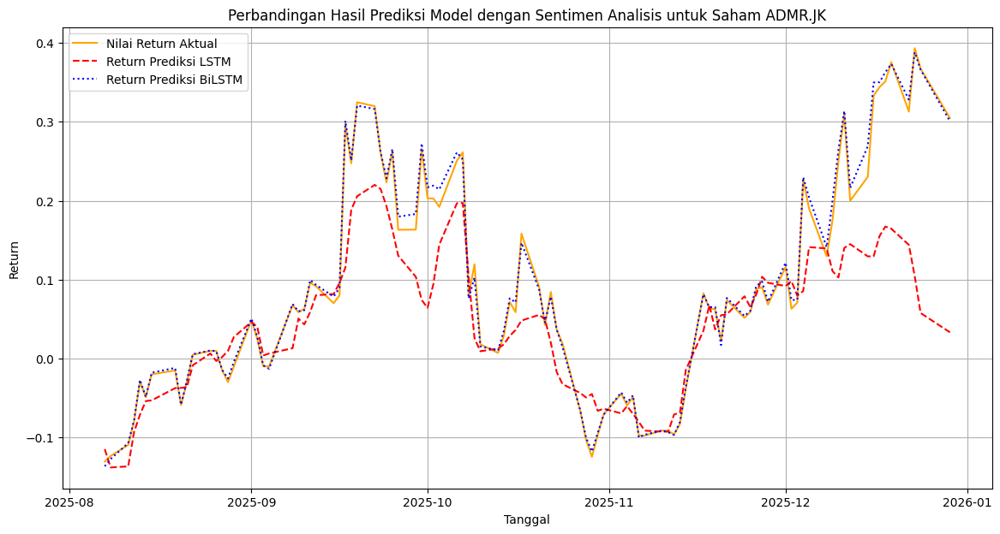

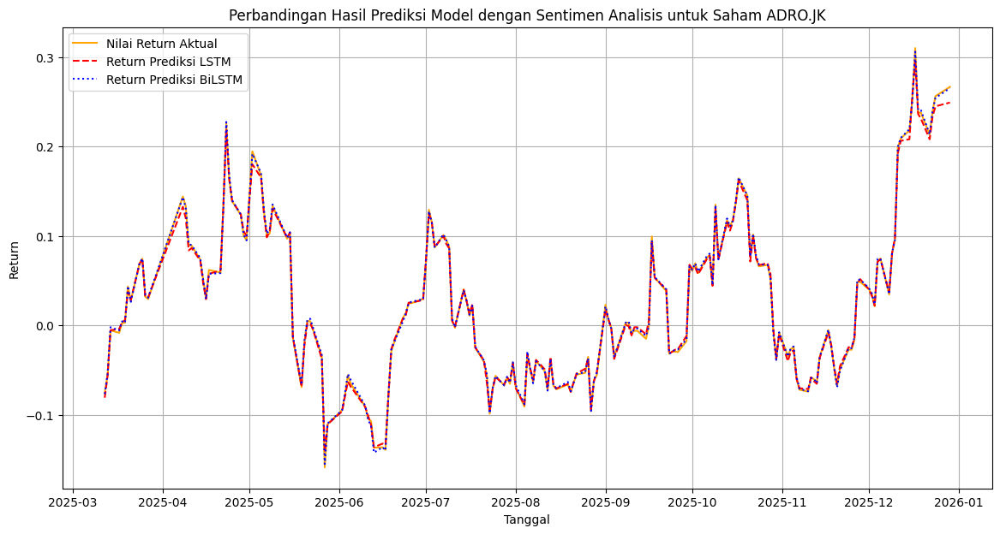

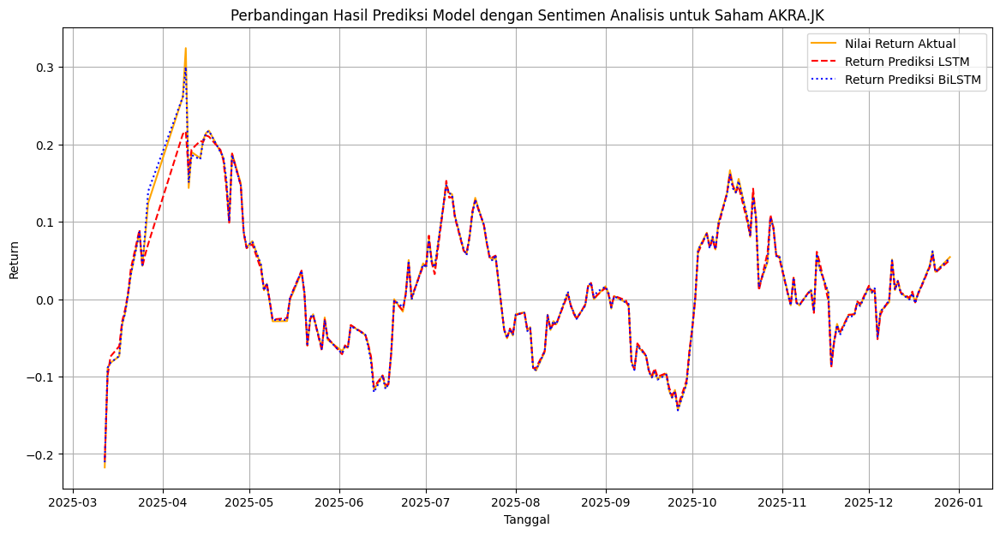

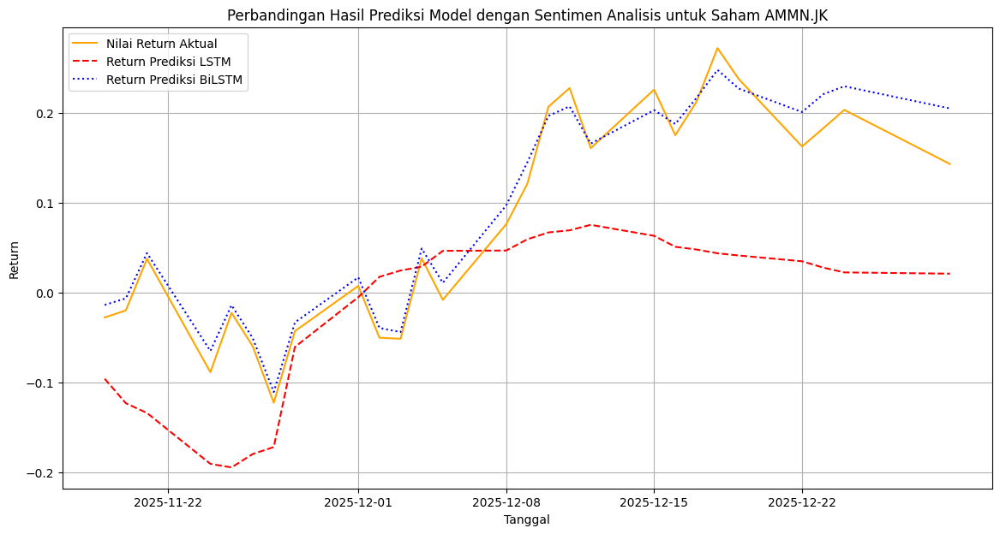

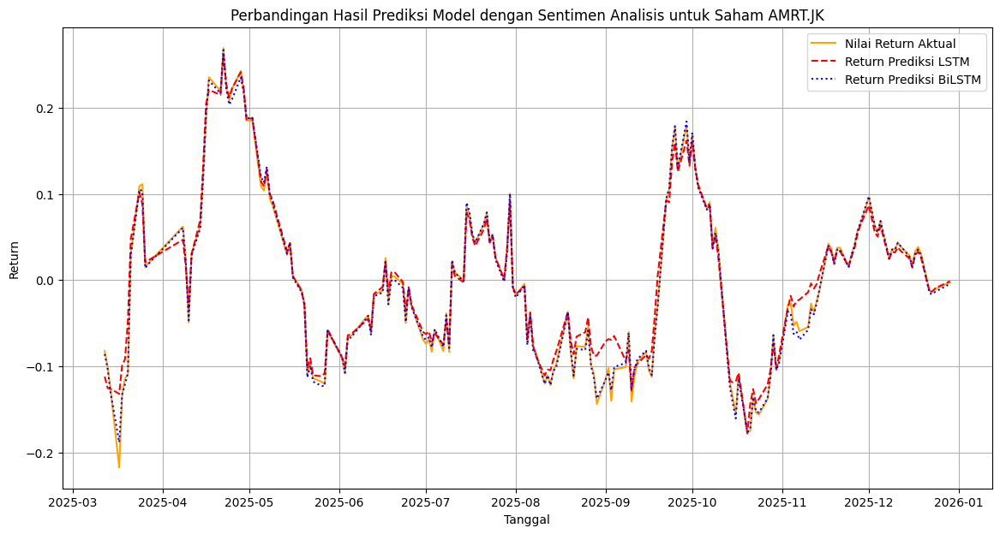

...

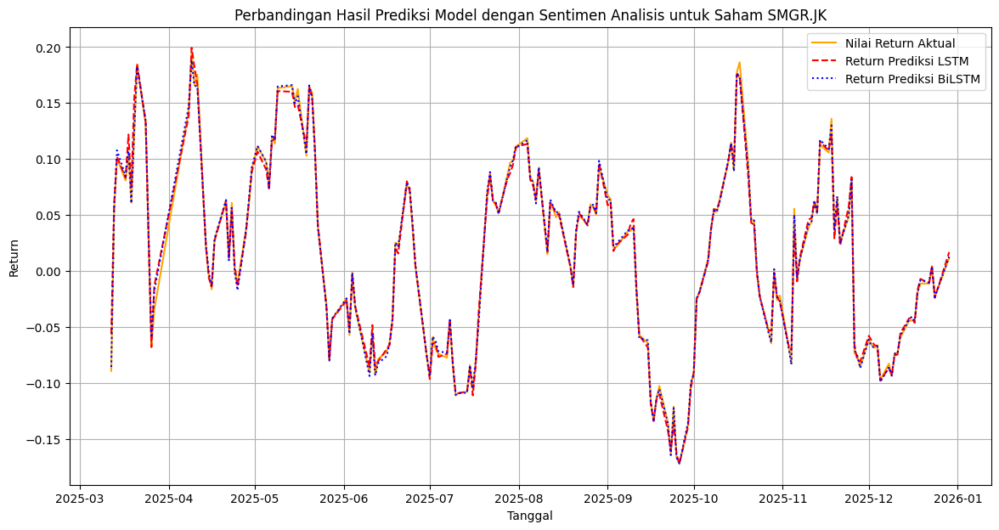

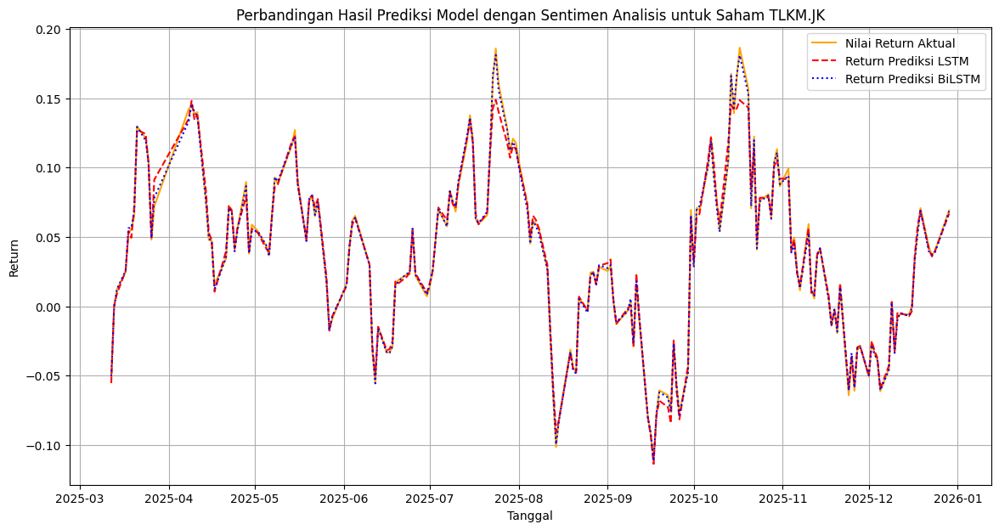

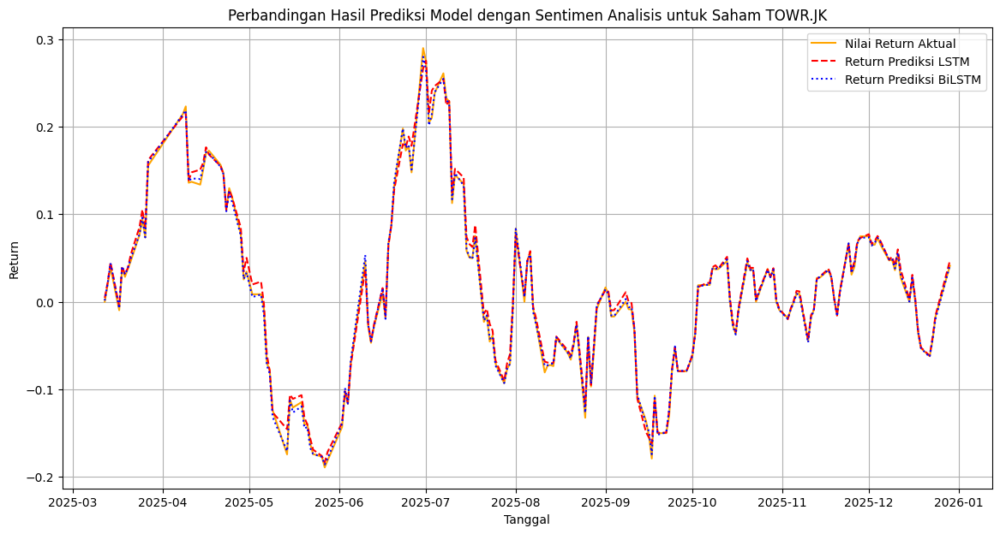

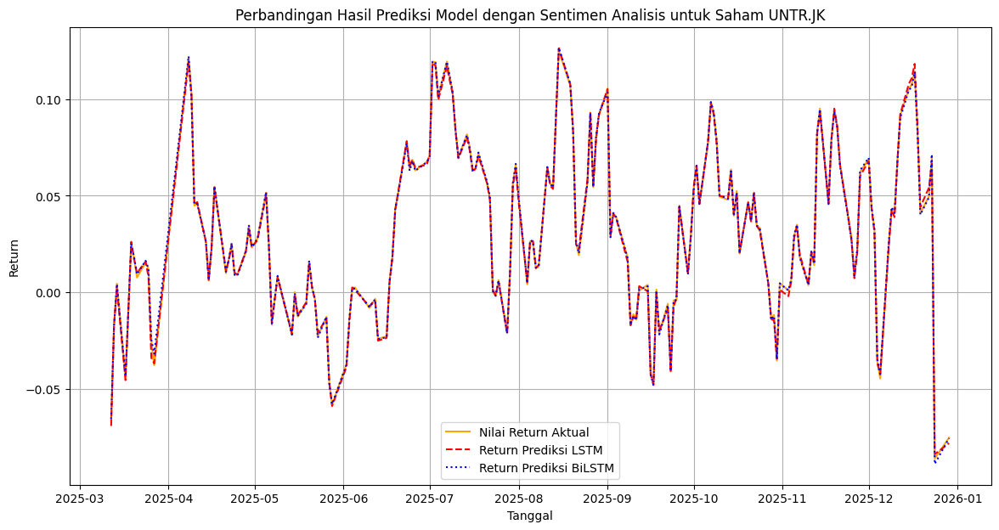

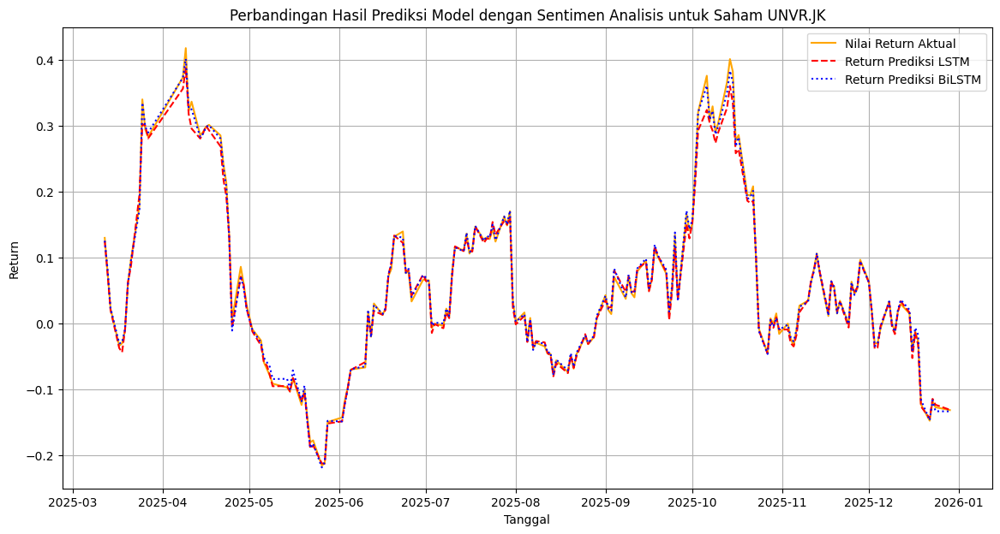

In [ ]:
for stock in stocks:
    if stock in lstm_all_dates_test and stock in bilstm_all_dates_test:
        dates_test = lstm_all_dates_test[stock]
        y_test_inv = lstm_all_y_test_inv[stock]
        lstm_y_pred_inv = lstm_all_y_pred_inv[stock]
        bilstm_y_pred_inv = bilstm_all_y_pred_inv[stock]

        plt.figure(figsize=(14, 7))
        plt.plot(dates_test, y_test_inv, label='Nilai Return Aktual', color='orange')
        plt.plot(dates_test, lstm_y_pred_inv, label='Return Prediksi LSTM', color='red', linestyle='--')
        plt.plot(dates_test, bilstm_y_pred_inv, label='Return Prediksi BiLSTM', color='blue', linestyle=':')

        plt.title(f'Perbandingan Hasil Prediksi Model dengan Sentimen Analisis untuk Saham {stock}')
        plt.xlabel('Tanggal')
        plt.ylabel('Return')
        plt.legend()
        plt.grid(True)
        plt.show()
    else:
        print(f"Skipping {stock} for plotting due to missing data in one or both models.")

Skipping AADI.JK for plotting due to missing data in one or both models.


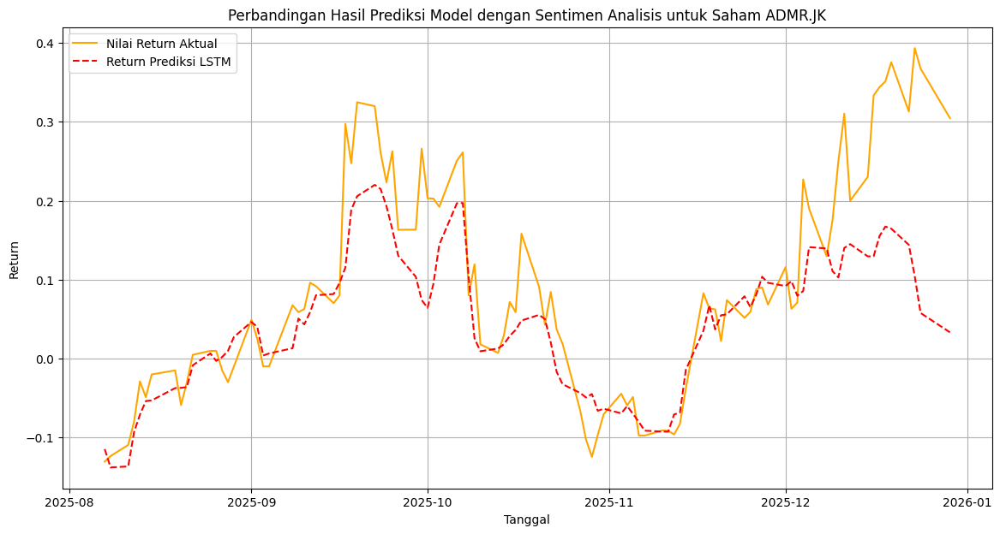

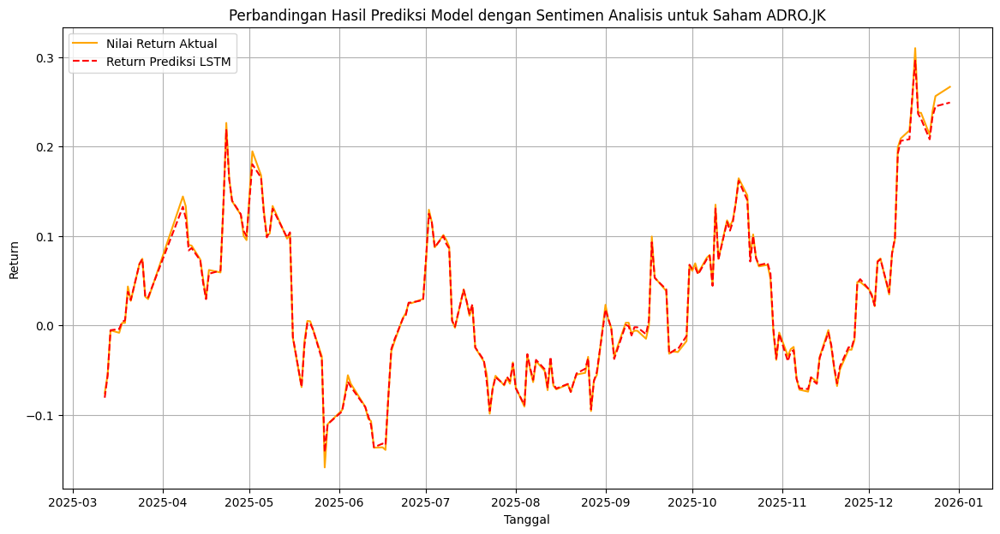

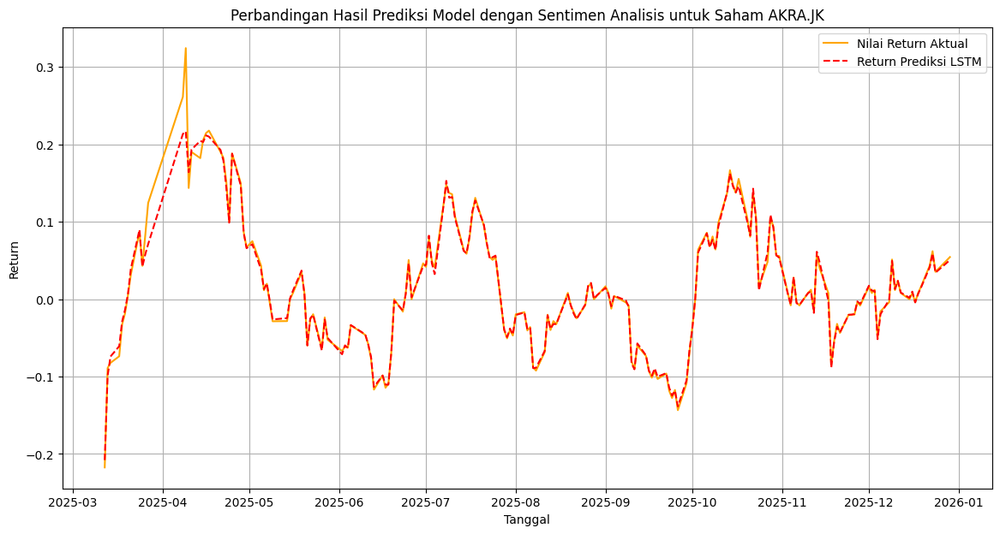

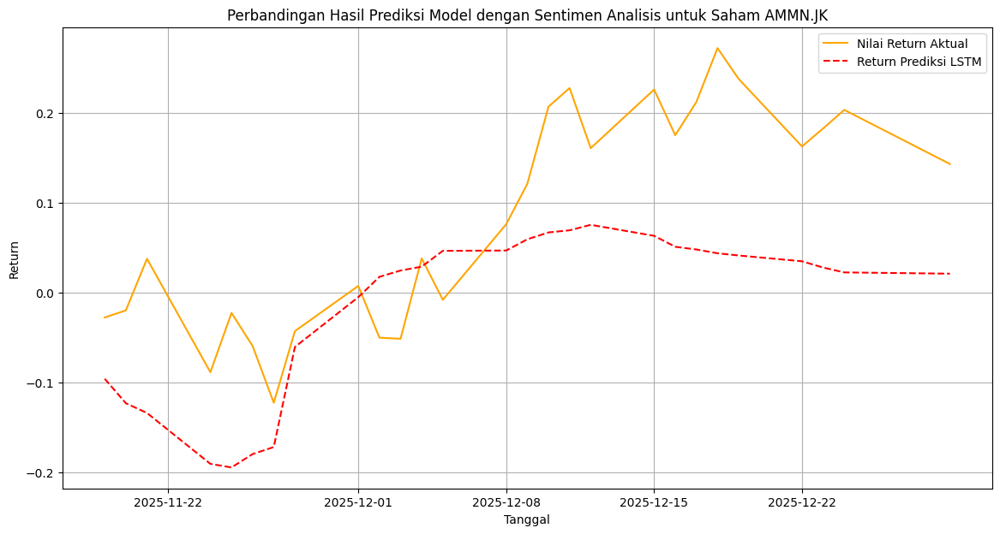

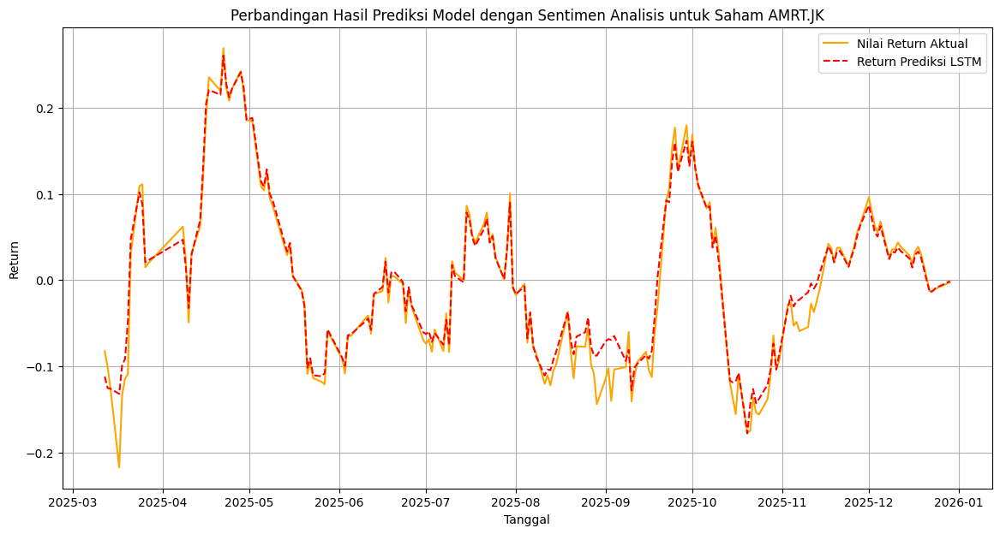

...

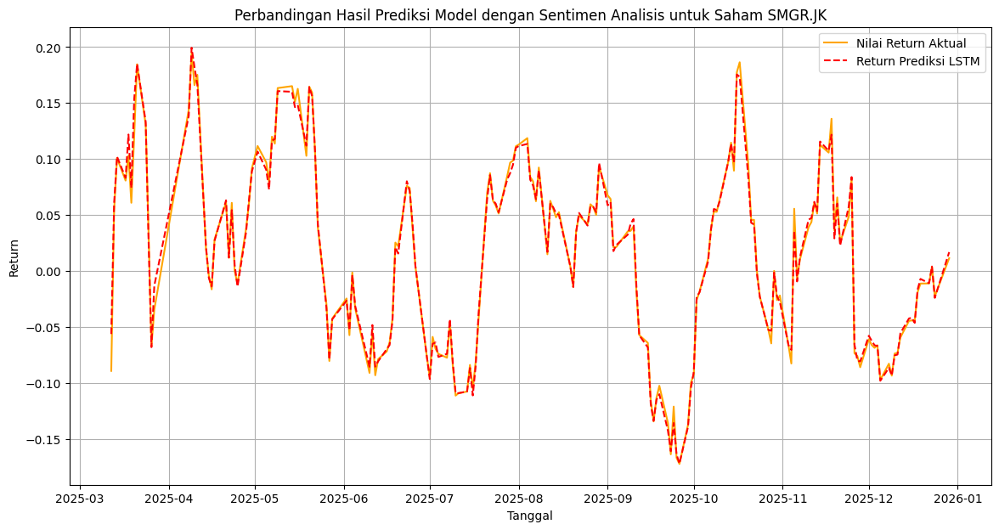

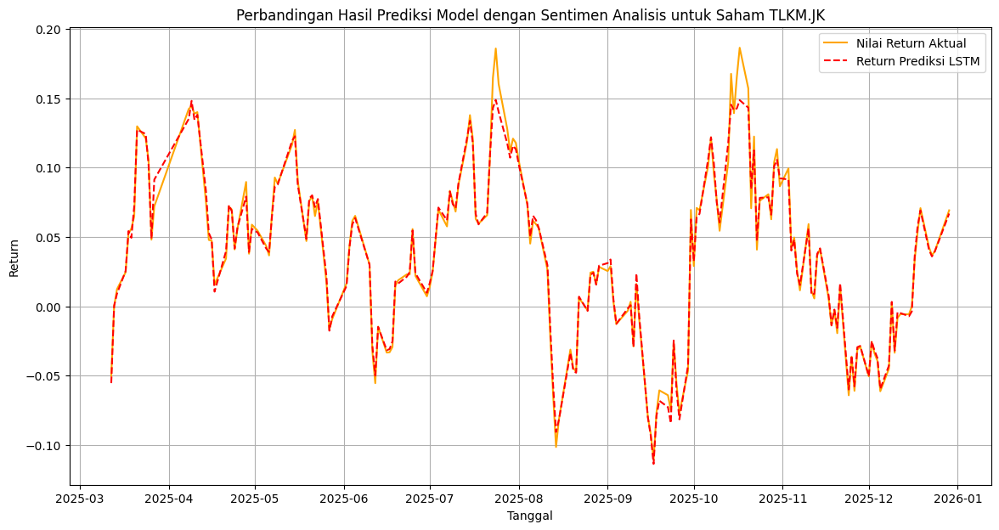

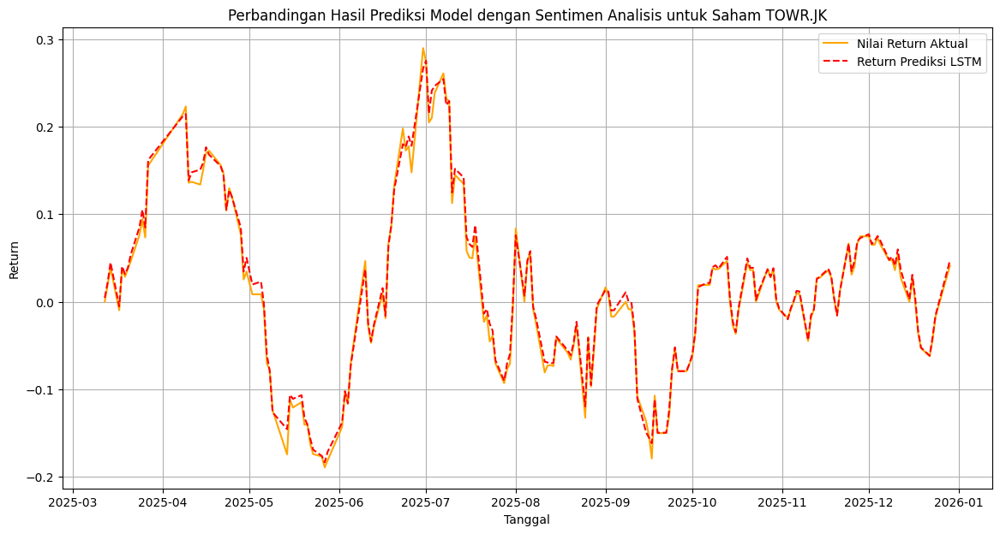

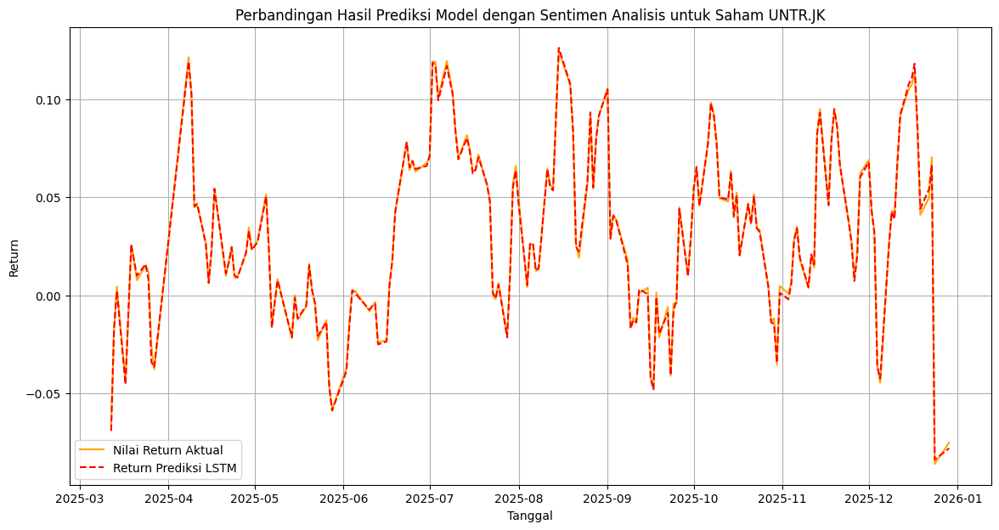

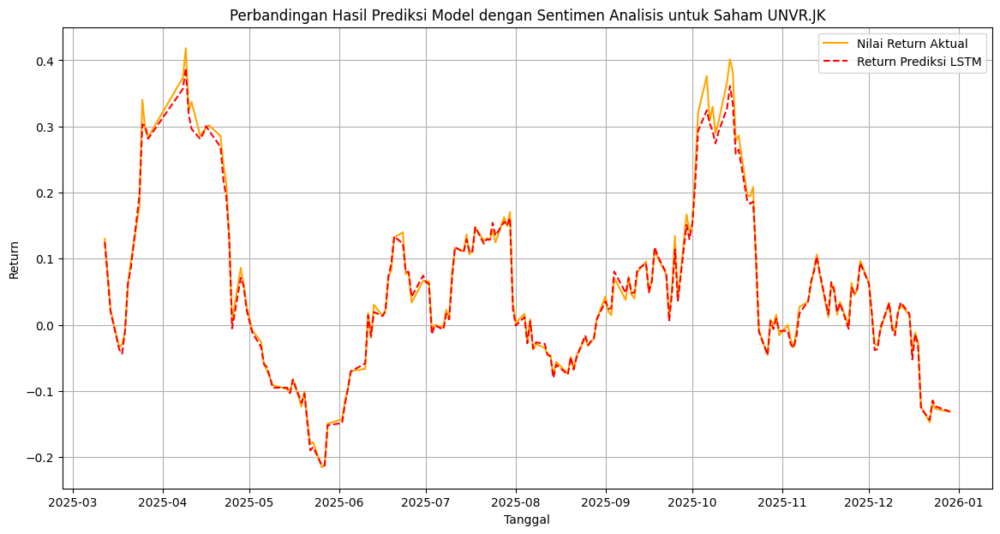

In [ ]:
for stock in stocks:
    if stock in lstm_all_dates_test and stock in bilstm_all_dates_test:
        dates_test = lstm_all_dates_test[stock]
        y_test_inv = lstm_all_y_test_inv[stock]
        lstm_y_pred_inv = lstm_all_y_pred_inv[stock]
        bilstm_y_pred_inv = bilstm_all_y_pred_inv[stock]

        plt.figure(figsize=(14, 7))
        plt.plot(dates_test, y_test_inv, label='Nilai Return Aktual', color='orange')
        plt.plot(dates_test, lstm_y_pred_inv, label='Return Prediksi LSTM', color='red', linestyle='--')
        #plt.plot(dates_test, bilstm_y_pred_inv, label='Return Prediksi BiLSTM', color='blue', linestyle=':')

        plt.title(f'Perbandingan Hasil Prediksi Model dengan Sentimen Analisis untuk Saham {stock}')
        plt.xlabel('Tanggal')
        plt.ylabel('Return')
        plt.legend()
        plt.grid(True)
        plt.show()
    else:
        print(f"Skipping {stock} for plotting due to missing data in one or both models.")

Skipping AADI.JK for plotting due to missing data in one or both models.


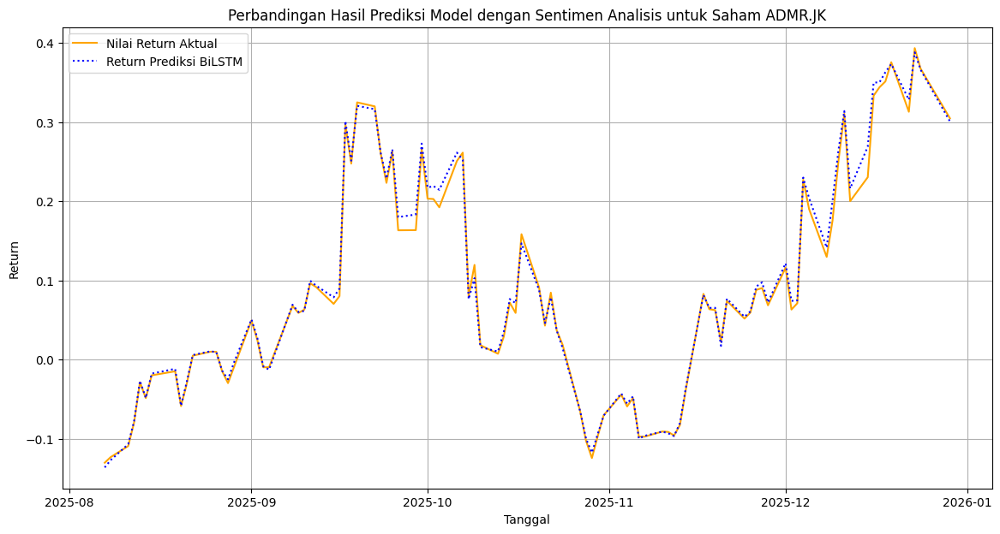

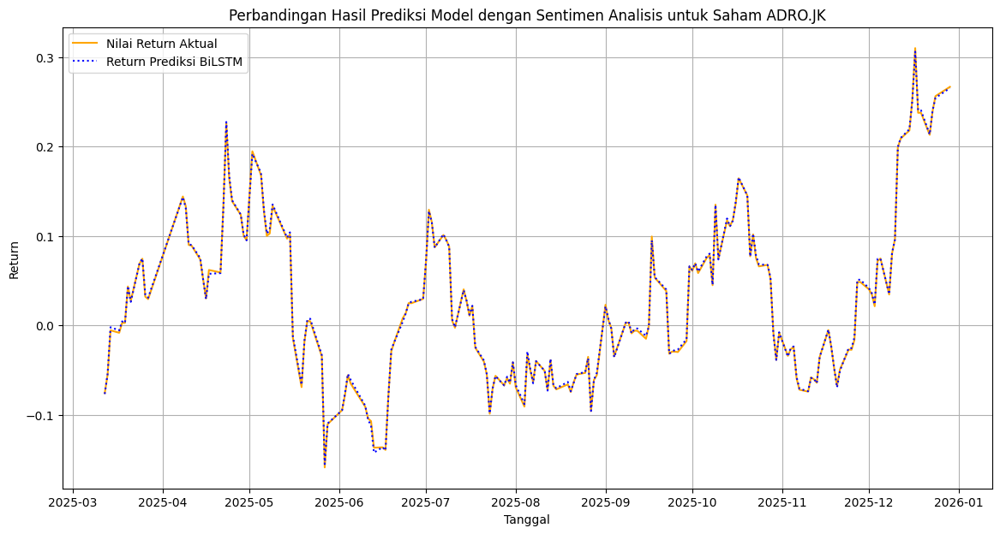

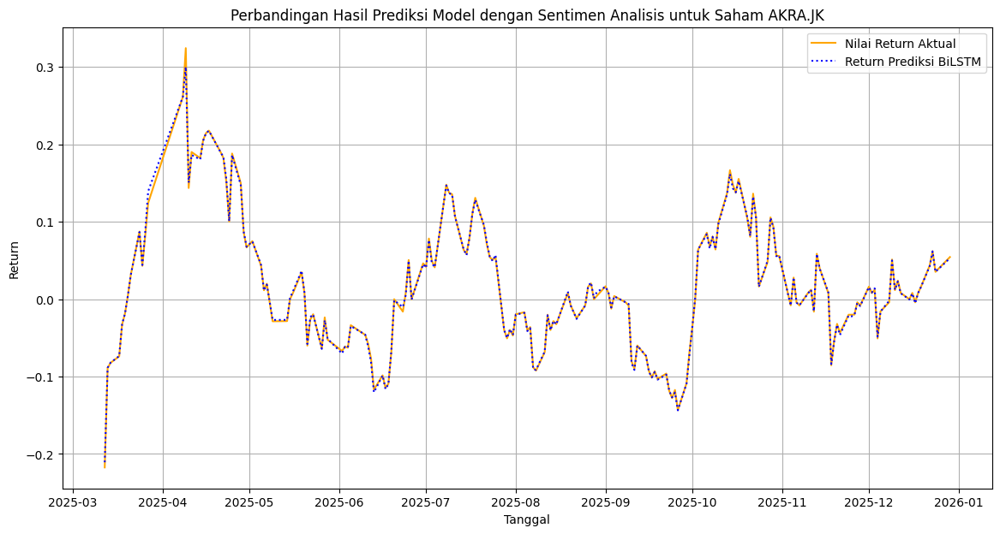

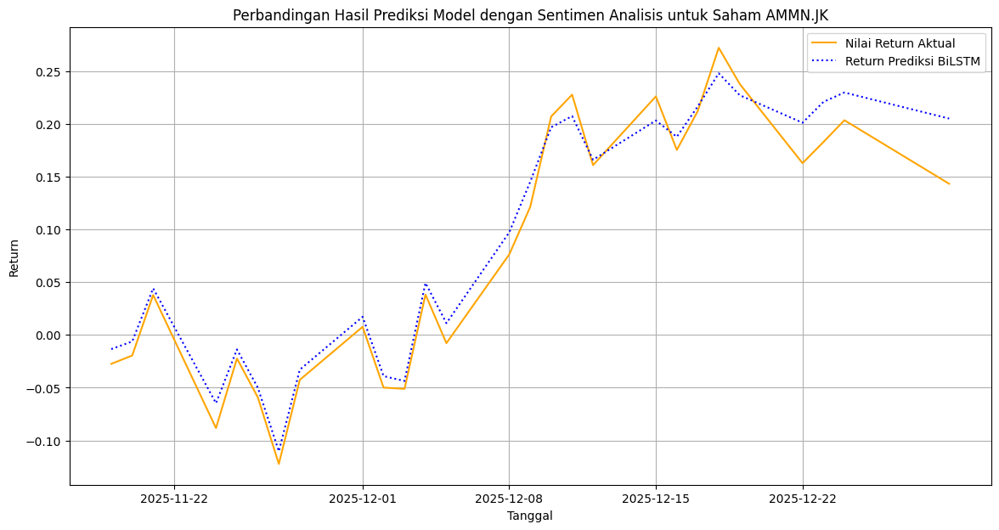

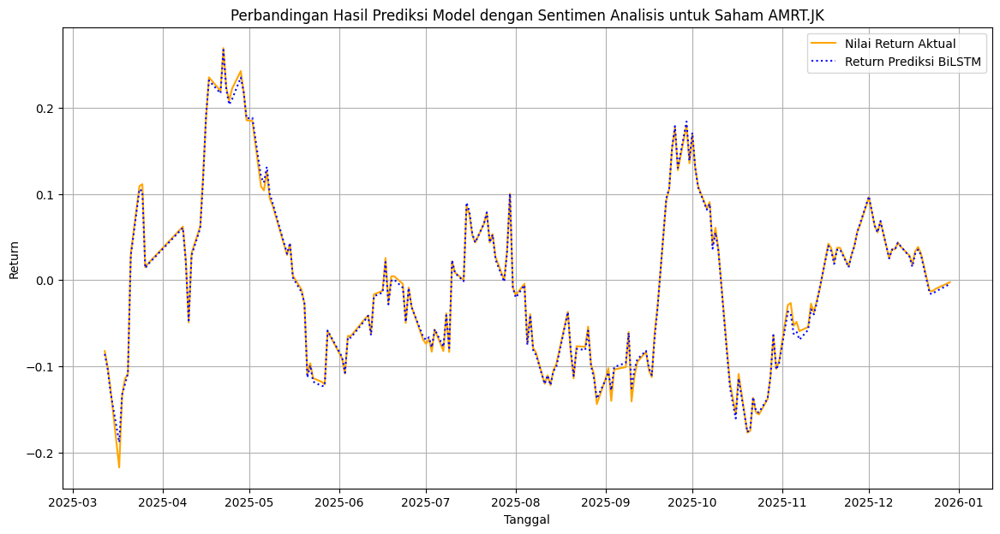

...

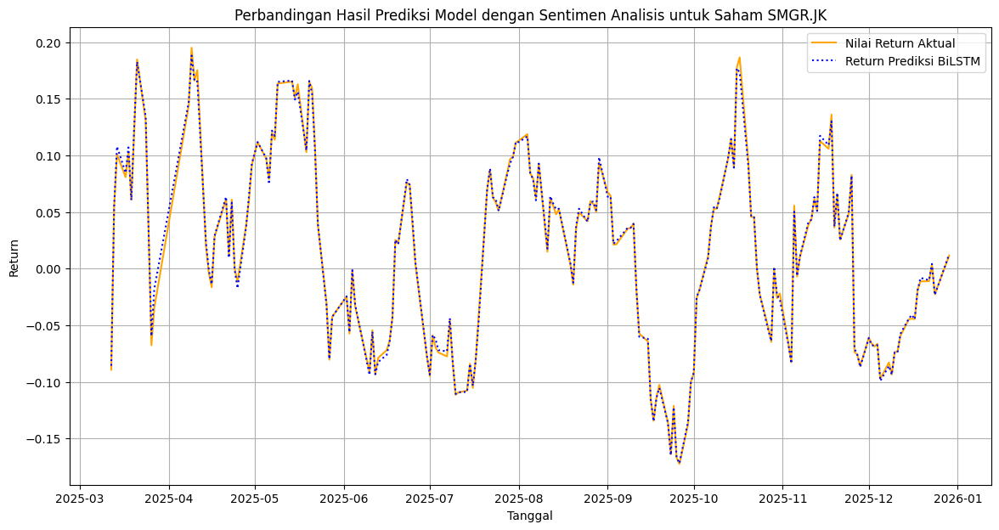

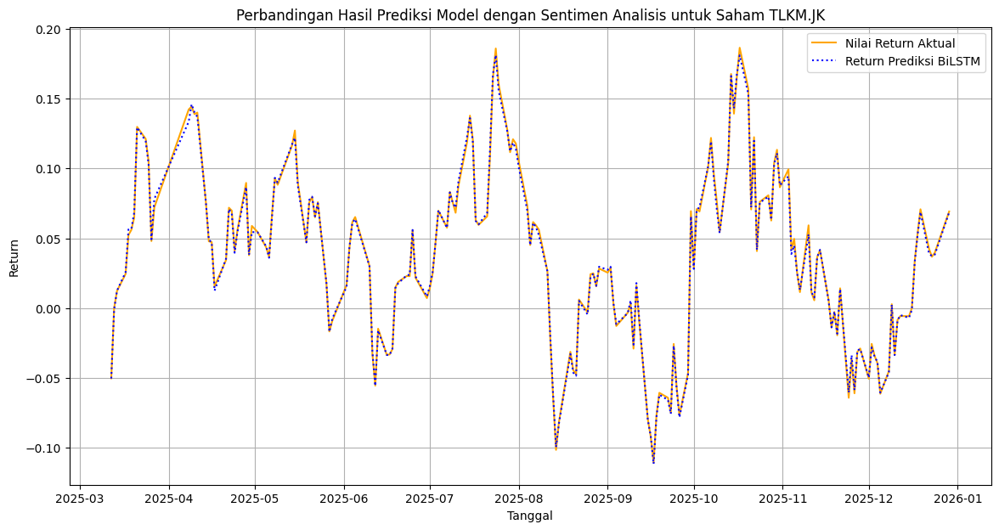

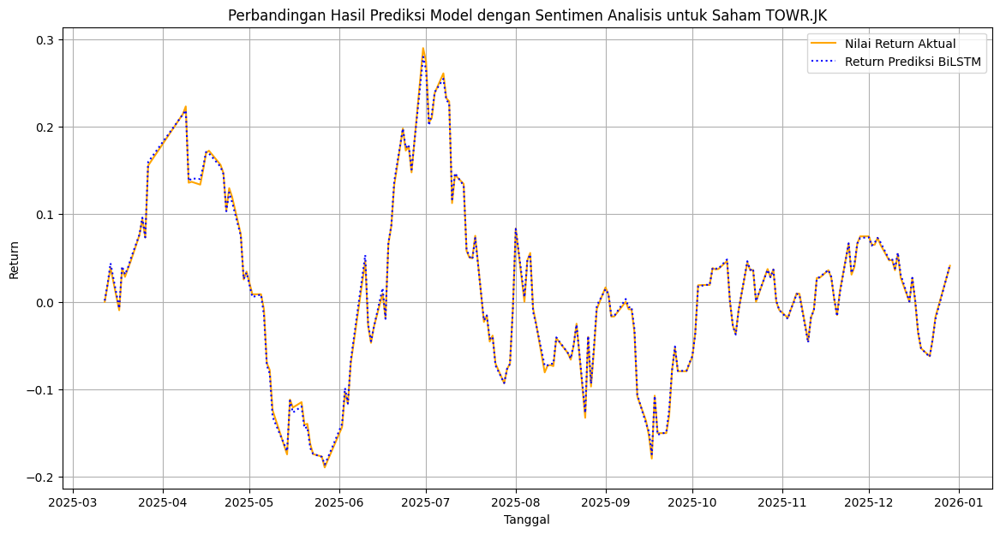

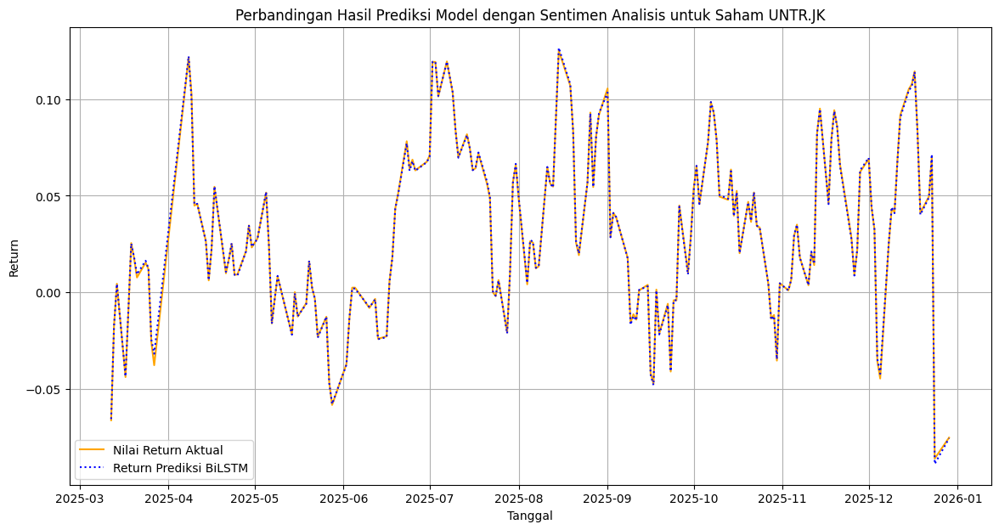

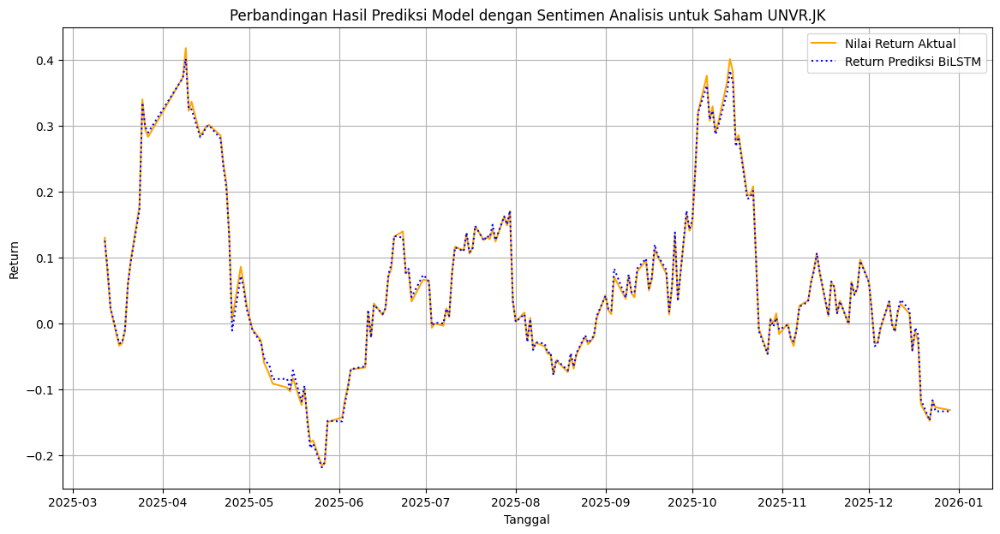

In [ ]:
for stock in stocks:
    if stock in lstm_all_dates_test and stock in bilstm_all_dates_test:
        dates_test = lstm_all_dates_test[stock]
        y_test_inv = lstm_all_y_test_inv[stock]
        lstm_y_pred_inv = lstm_all_y_pred_inv[stock]
        bilstm_y_pred_inv = bilstm_all_y_pred_inv[stock]

        plt.figure(figsize=(14, 7))
        plt.plot(dates_test, y_test_inv, label='Nilai Return Aktual', color='orange')
        #plt.plot(dates_test, lstm_y_pred_inv, label='Return Prediksi LSTM', color='red', linestyle='--')
        plt.plot(dates_test, bilstm_y_pred_inv, label='Return Prediksi BiLSTM', color='blue', linestyle=':')

        plt.title(f'Perbandingan Hasil Prediksi Model dengan Sentimen Analisis untuk Saham {stock}')
        plt.xlabel('Tanggal')
        plt.ylabel('Return')
        plt.legend()
        plt.grid(True)
        plt.show()
    else:
        print(f"Skipping {stock} for plotting due to missing data in one or both models.")

## BiLSTM Portfolio

In [ ]:
selection_method = 'top_returns'
k = 10

R2 = 0.0
DA = 0.80

filtered_evaluation_metrics = []
filtered_pred_returns = []

for i, metric_entry in enumerate(all_evaluation_metrics):
    if (metric_entry['R^2'] > R2) and \
       (metric_entry['Directional Accuracy'] > DA) and \
       (metric_entry['Stock'] not in ['AADI.JK']):
        filtered_evaluation_metrics.append(metric_entry)
        filtered_pred_returns.append(all_pred_returns[i])

if not filtered_evaluation_metrics:
    print("None")
else:
    stock_analysis_df = pd.DataFrame({
        'Stock': [m['Stock'] for m in filtered_evaluation_metrics],
        'PredictedReturn': filtered_pred_returns
    })

    k_actual = min(k, len(stock_analysis_df))

    if selection_method == 'top_returns':
        selected_stocks_data = stock_analysis_df.nlargest(k_actual, 'PredictedReturn')
    else:
        selected_stocks_data = stock_analysis_df.nlargest(k_actual, 'PredictedReturn')

    stocks_filtered = selected_stocks_data['Stock'].tolist()
    mu = np.array(selected_stocks_data['PredictedReturn'].tolist(), dtype=float)

    returns_df = pd.DataFrame()
    for stock in stocks_filtered:
        data = yf.download(stock, start="2020-03-01", end="2026-03-31", auto_adjust=True, progress=False)
        if not data.empty:
            if isinstance(data.columns, pd.MultiIndex):
                data.columns = data.columns.get_level_values(0)

            returns_df[stock] = np.log(data['Close'] / data['Close'].shift(1))

    returns_df = returns_df.dropna()
    cov_matrix = returns_df.cov()

    n = len(mu)
    def portfolio_volatility(w):
        return np.sqrt(w.T @ cov_matrix.values @ w)

    constraints = ({'type': 'eq', 'fun': lambda w: np.sum(w) - 1})
    bounds = [(0.0010, 1) for _ in range(n)]

    w0 = np.ones(n) / n

    result = minimize(portfolio_volatility, w0, method='SLSQP', bounds=bounds, constraints=constraints)

    if result.success:
        weights = result.x
        portfolio = pd.DataFrame({"Stock": stocks_filtered, "Weight": weights})
        pd.options.display.float_format = '{:.5f}'.format

        print("\n--- Optimized Portfolio Weights ---")
        print(portfolio)

        port_return = np.dot(weights, mu)
        port_vol = np.sqrt(weights.T @ cov_matrix.values @ weights)

        print(f"\nExpected Portfolio Return: {port_return:.5f}")
        print(f"Portfolio Volatility (Risk): {port_vol:.5f}")
    else:
        print("Optimasi gagal konvergen.")


--- Optimized Portfolio Weights ---
     Stock  Weight
0  INCO.JK 0.04229
1  ADMR.JK 0.02042
2  MBMA.JK 0.00100
3  NCKL.JK 0.12634
4  BUMI.JK 0.05450
5  MDKA.JK 0.00100
6  AMMN.JK 0.12588
7  ANTM.JK 0.16552
8  ADRO.JK 0.27044
9  INKP.JK 0.19261

Expected Portfolio Return: 0.21593
Portfolio Volatility (Risk): 0.01841


In [ ]:
selection_method = 'top_returns'
k = 9

R2 = 0.0
DA = 0.80

filtered_evaluation_metrics = []
filtered_pred_returns = []

for i, metric_entry in enumerate(all_evaluation_metrics):
    if (metric_entry['R^2'] > R2) and \
       (metric_entry['Directional Accuracy'] > DA) and \
       (metric_entry['Stock'] not in ['AADI.JK']):
        filtered_evaluation_metrics.append(metric_entry)
        filtered_pred_returns.append(all_pred_returns[i])

if not filtered_evaluation_metrics:
    print("None")
else:
    stock_analysis_df = pd.DataFrame({
        'Stock': [m['Stock'] for m in filtered_evaluation_metrics],
        'PredictedReturn': filtered_pred_returns
    })

    k_actual = min(k, len(stock_analysis_df))

    if selection_method == 'top_returns':
        selected_stocks_data = stock_analysis_df.nlargest(k_actual, 'PredictedReturn')
    else:
        selected_stocks_data = stock_analysis_df.nlargest(k_actual, 'PredictedReturn')

    stocks_filtered = selected_stocks_data['Stock'].tolist()
    mu = np.array(selected_stocks_data['PredictedReturn'].tolist(), dtype=float)

    returns_df = pd.DataFrame()
    for stock in stocks_filtered:
        data = yf.download(stock, start="2020-03-01", end="2026-03-31", auto_adjust=True, progress=False)
        if not data.empty:
            if isinstance(data.columns, pd.MultiIndex):
                data.columns = data.columns.get_level_values(0)

            returns_df[stock] = np.log(data['Close'] / data['Close'].shift(1))

    returns_df = returns_df.dropna()
    cov_matrix = returns_df.cov()

    n = len(mu)
    def portfolio_volatility(w):
        return np.sqrt(w.T @ cov_matrix.values @ w)

    constraints = ({'type': 'eq', 'fun': lambda w: np.sum(w) - 1})
    bounds = [(0.0010, 1) for _ in range(n)]

    w0 = np.ones(n) / n

    result = minimize(portfolio_volatility, w0, method='SLSQP', bounds=bounds, constraints=constraints)

    if result.success:
        weights = result.x
        portfolio = pd.DataFrame({"Stock": stocks_filtered, "Weight": weights})
        pd.options.display.float_format = '{:.5f}'.format

        print("\n--- Optimized Portfolio Weights ---")
        print(portfolio)

        port_return = np.dot(weights, mu)
        port_vol = np.sqrt(weights.T @ cov_matrix.values @ weights)

        print(f"\nExpected Portfolio Return: {port_return:.5f}")
        print(f"Portfolio Volatility (Risk): {port_vol:.5f}")
    else:
        print("Optimasi gagal konvergen.")


--- Optimized Portfolio Weights ---
     Stock  Weight
0  INCO.JK 0.06279
1  ADMR.JK 0.03373
2  MBMA.JK 0.00100
3  NCKL.JK 0.16962
4  BUMI.JK 0.07226
5  MDKA.JK 0.00100
6  AMMN.JK 0.14825
7  ANTM.JK 0.19697
8  ADRO.JK 0.31438

Expected Portfolio Return: 0.22864
Portfolio Volatility (Risk): 0.01907


In [ ]:
selection_method = 'top_returns'
k = 8

R2 = 0.0
DA = 0.80

filtered_evaluation_metrics = []
filtered_pred_returns = []

for i, metric_entry in enumerate(all_evaluation_metrics):
    if (metric_entry['R^2'] > R2) and \
       (metric_entry['Directional Accuracy'] > DA) and \
       (metric_entry['Stock'] not in ['AADI.JK']):
        filtered_evaluation_metrics.append(metric_entry)
        filtered_pred_returns.append(all_pred_returns[i])

if not filtered_evaluation_metrics:
    print("None")
else:
    stock_analysis_df = pd.DataFrame({
        'Stock': [m['Stock'] for m in filtered_evaluation_metrics],
        'PredictedReturn': filtered_pred_returns
    })

    k_actual = min(k, len(stock_analysis_df))

    if selection_method == 'top_returns':
        selected_stocks_data = stock_analysis_df.nlargest(k_actual, 'PredictedReturn')
    else:
        selected_stocks_data = stock_analysis_df.nlargest(k_actual, 'PredictedReturn')

    stocks_filtered = selected_stocks_data['Stock'].tolist()
    mu = np.array(selected_stocks_data['PredictedReturn'].tolist(), dtype=float)

    returns_df = pd.DataFrame()
    for stock in stocks_filtered:
        data = yf.download(stock, start="2020-03-01", end="2026-03-31", auto_adjust=True, progress=False)
        if not data.empty:
            if isinstance(data.columns, pd.MultiIndex):
                data.columns = data.columns.get_level_values(0)

            returns_df[stock] = np.log(data['Close'] / data['Close'].shift(1))

    returns_df = returns_df.dropna()
    cov_matrix = returns_df.cov()

    n = len(mu)
    def portfolio_volatility(w):
        return np.sqrt(w.T @ cov_matrix.values @ w)

    constraints = ({'type': 'eq', 'fun': lambda w: np.sum(w) - 1})
    bounds = [(0.0010, 1) for _ in range(n)]

    w0 = np.ones(n) / n

    result = minimize(portfolio_volatility, w0, method='SLSQP', bounds=bounds, constraints=constraints)

    if result.success:
        weights = result.x
        portfolio = pd.DataFrame({"Stock": stocks_filtered, "Weight": weights})
        pd.options.display.float_format = '{:.5f}'.format

        print("\n--- Optimized Portfolio Weights ---")
        print(portfolio)

        port_return = np.dot(weights, mu)
        port_vol = np.sqrt(weights.T @ cov_matrix.values @ weights)

        print(f"\nExpected Portfolio Return: {port_return:.5f}")
        print(f"Portfolio Volatility (Risk): {port_vol:.5f}")
    else:
        print("Optimasi gagal konvergen.")


--- Optimized Portfolio Weights ---
     Stock  Weight
0  INCO.JK 0.10036
1  ADMR.JK 0.16305
2  MBMA.JK 0.00100
3  NCKL.JK 0.22425
4  BUMI.JK 0.09011
5  MDKA.JK 0.00634
6  AMMN.JK 0.17411
7  ANTM.JK 0.24078

Expected Portfolio Return: 0.25009
Portfolio Volatility (Risk): 0.02074


In [ ]:
selection_method = 'top_returns'
k = 7

R2 = 0.0
DA = 0.80

filtered_evaluation_metrics = []
filtered_pred_returns = []

for i, metric_entry in enumerate(all_evaluation_metrics):
    if (metric_entry['R^2'] > R2) and \
       (metric_entry['Directional Accuracy'] > DA) and \
       (metric_entry['Stock'] not in ['AADI.JK']):
        filtered_evaluation_metrics.append(metric_entry)
        filtered_pred_returns.append(all_pred_returns[i])

if not filtered_evaluation_metrics:
    print("None")
else:
    stock_analysis_df = pd.DataFrame({
        'Stock': [m['Stock'] for m in filtered_evaluation_metrics],
        'PredictedReturn': filtered_pred_returns
    })

    k_actual = min(k, len(stock_analysis_df))

    if selection_method == 'top_returns':
        selected_stocks_data = stock_analysis_df.nlargest(k_actual, 'PredictedReturn')
    else:
        selected_stocks_data = stock_analysis_df.nlargest(k_actual, 'PredictedReturn')

    stocks_filtered = selected_stocks_data['Stock'].tolist()
    mu = np.array(selected_stocks_data['PredictedReturn'].tolist(), dtype=float)

    returns_df = pd.DataFrame()
    for stock in stocks_filtered:
        data = yf.download(stock, start="2020-03-01", end="2026-03-31", auto_adjust=True, progress=False)
        if not data.empty:
            if isinstance(data.columns, pd.MultiIndex):
                data.columns = data.columns.get_level_values(0)

            returns_df[stock] = np.log(data['Close'] / data['Close'].shift(1))

    returns_df = returns_df.dropna()
    cov_matrix = returns_df.cov()

    n = len(mu)
    def portfolio_volatility(w):
        return np.sqrt(w.T @ cov_matrix.values @ w)

    constraints = ({'type': 'eq', 'fun': lambda w: np.sum(w) - 1})
    bounds = [(0.0010, 1) for _ in range(n)]

    w0 = np.ones(n) / n

    result = minimize(portfolio_volatility, w0, method='SLSQP', bounds=bounds, constraints=constraints)

    if result.success:
        weights = result.x
        portfolio = pd.DataFrame({"Stock": stocks_filtered, "Weight": weights})
        pd.options.display.float_format = '{:.5f}'.format

        print("\n--- Optimized Portfolio Weights ---")
        print(portfolio)

        port_return = np.dot(weights, mu)
        port_vol = np.sqrt(weights.T @ cov_matrix.values @ weights)

        print(f"\nExpected Portfolio Return: {port_return:.5f}")
        print(f"Portfolio Volatility (Risk): {port_vol:.5f}")
    else:
        print("Optimasi gagal konvergen.")


--- Optimized Portfolio Weights ---
     Stock  Weight
0  INCO.JK 0.17098
1  ADMR.JK 0.19783
2  MBMA.JK 0.00100
3  NCKL.JK 0.24606
4  BUMI.JK 0.10816
5  MDKA.JK 0.07649
6  AMMN.JK 0.19948

Expected Portfolio Return: 0.26604
Portfolio Volatility (Risk): 0.02154


In [ ]:
selection_method = 'top_returns'
k = 6

R2 = 0.0
DA = 0.80

filtered_evaluation_metrics = []
filtered_pred_returns = []

for i, metric_entry in enumerate(all_evaluation_metrics):
    if (metric_entry['R^2'] > R2) and \
       (metric_entry['Directional Accuracy'] > DA) and \
       (metric_entry['Stock'] not in ['AADI.JK']):
        filtered_evaluation_metrics.append(metric_entry)
        filtered_pred_returns.append(all_pred_returns[i])

if not filtered_evaluation_metrics:
    print("None")
else:
    stock_analysis_df = pd.DataFrame({
        'Stock': [m['Stock'] for m in filtered_evaluation_metrics],
        'PredictedReturn': filtered_pred_returns
    })

    k_actual = min(k, len(stock_analysis_df))

    if selection_method == 'top_returns':
        selected_stocks_data = stock_analysis_df.nlargest(k_actual, 'PredictedReturn')
    else:
        selected_stocks_data = stock_analysis_df.nlargest(k_actual, 'PredictedReturn')

    stocks_filtered = selected_stocks_data['Stock'].tolist()
    mu = np.array(selected_stocks_data['PredictedReturn'].tolist(), dtype=float)

    returns_df = pd.DataFrame()
    for stock in stocks_filtered:
        data = yf.download(stock, start="2020-03-01", end="2026-03-31", auto_adjust=True, progress=False)
        if not data.empty:
            if isinstance(data.columns, pd.MultiIndex):
                data.columns = data.columns.get_level_values(0)

            returns_df[stock] = np.log(data['Close'] / data['Close'].shift(1))

    returns_df = returns_df.dropna()
    cov_matrix = returns_df.cov()

    n = len(mu)
    def portfolio_volatility(w):
        return np.sqrt(w.T @ cov_matrix.values @ w)

    constraints = ({'type': 'eq', 'fun': lambda w: np.sum(w) - 1})
    bounds = [(0.0010, 1) for _ in range(n)]

    w0 = np.ones(n) / n

    result = minimize(portfolio_volatility, w0, method='SLSQP', bounds=bounds, constraints=constraints)

    if result.success:
        weights = result.x
        portfolio = pd.DataFrame({"Stock": stocks_filtered, "Weight": weights})
        pd.options.display.float_format = '{:.5f}'.format

        print("\n--- Optimized Portfolio Weights ---")
        print(portfolio)

        port_return = np.dot(weights, mu)
        port_vol = np.sqrt(weights.T @ cov_matrix.values @ weights)

        print(f"\nExpected Portfolio Return: {port_return:.5f}")
        print(f"Portfolio Volatility (Risk): {port_vol:.5f}")
    else:
        print("Optimasi gagal konvergen.")


--- Optimized Portfolio Weights ---
     Stock  Weight
0  INCO.JK 0.23679
1  ADMR.JK 0.24114
2  MBMA.JK 0.00486
3  NCKL.JK 0.25321
4  BUMI.JK 0.14724
5  MDKA.JK 0.11676

Expected Portfolio Return: 0.27959
Portfolio Volatility (Risk): 0.02280


In [ ]:
selection_method = 'top_returns'
k = 5

R2 = 0.0
DA = 0.80

filtered_evaluation_metrics = []
filtered_pred_returns = []

for i, metric_entry in enumerate(all_evaluation_metrics):
    if (metric_entry['R^2'] > R2) and \
       (metric_entry['Directional Accuracy'] > DA) and \
       (metric_entry['Stock'] not in ['AADI.JK']):
        filtered_evaluation_metrics.append(metric_entry)
        filtered_pred_returns.append(all_pred_returns[i])

if not filtered_evaluation_metrics:
    print("None")
else:
    stock_analysis_df = pd.DataFrame({
        'Stock': [m['Stock'] for m in filtered_evaluation_metrics],
        'PredictedReturn': filtered_pred_returns
    })

    k_actual = min(k, len(stock_analysis_df))

    if selection_method == 'top_returns':
        selected_stocks_data = stock_analysis_df.nlargest(k_actual, 'PredictedReturn')
    else:
        selected_stocks_data = stock_analysis_df.nlargest(k_actual, 'PredictedReturn')

    stocks_filtered = selected_stocks_data['Stock'].tolist()
    mu = np.array(selected_stocks_data['PredictedReturn'].tolist(), dtype=float)

    returns_df = pd.DataFrame()
    for stock in stocks_filtered:
        data = yf.download(stock, start="2020-03-01", end="2026-03-31", auto_adjust=True, progress=False)
        if not data.empty:
            if isinstance(data.columns, pd.MultiIndex):
                data.columns = data.columns.get_level_values(0)

            returns_df[stock] = np.log(data['Close'] / data['Close'].shift(1))

    returns_df = returns_df.dropna()
    cov_matrix = returns_df.cov()

    n = len(mu)
    def portfolio_volatility(w):
        return np.sqrt(w.T @ cov_matrix.values @ w)

    constraints = ({'type': 'eq', 'fun': lambda w: np.sum(w) - 1})
    bounds = [(0.0010, 1) for _ in range(n)]

    w0 = np.ones(n) / n

    result = minimize(portfolio_volatility, w0, method='SLSQP', bounds=bounds, constraints=constraints)

    if result.success:
        weights = result.x
        portfolio = pd.DataFrame({"Stock": stocks_filtered, "Weight": weights})
        pd.options.display.float_format = '{:.5f}'.format

        print("\n--- Optimized Portfolio Weights ---")
        print(portfolio)

        port_return = np.dot(weights, mu)
        port_vol = np.sqrt(weights.T @ cov_matrix.values @ weights)

        print(f"\nExpected Portfolio Return: {port_return:.5f}")
        print(f"Portfolio Volatility (Risk): {port_vol:.5f}")
    else:
        print("Optimasi gagal konvergen.")


--- Optimized Portfolio Weights ---
     Stock  Weight
0  INCO.JK 0.26441
1  ADMR.JK 0.27525
2  MBMA.JK 0.04554
3  NCKL.JK 0.26399
4  BUMI.JK 0.15082

Expected Portfolio Return: 0.28694
Portfolio Volatility (Risk): 0.02307


In [ ]:
selection_method = 'top_returns'
k = 4

R2 = 0.0
DA = 0.80

filtered_evaluation_metrics = []
filtered_pred_returns = []

for i, metric_entry in enumerate(all_evaluation_metrics):
    if (metric_entry['R^2'] > R2) and \
       (metric_entry['Directional Accuracy'] > DA) and \
       (metric_entry['Stock'] not in ['AADI.JK']):
        filtered_evaluation_metrics.append(metric_entry)
        filtered_pred_returns.append(all_pred_returns[i])

if not filtered_evaluation_metrics:
    print("None")
else:
    stock_analysis_df = pd.DataFrame({
        'Stock': [m['Stock'] for m in filtered_evaluation_metrics],
        'PredictedReturn': filtered_pred_returns
    })

    k_actual = min(k, len(stock_analysis_df))

    if selection_method == 'top_returns':
        selected_stocks_data = stock_analysis_df.nlargest(k_actual, 'PredictedReturn')
    else:
        selected_stocks_data = stock_analysis_df.nlargest(k_actual, 'PredictedReturn')

    stocks_filtered = selected_stocks_data['Stock'].tolist()
    mu = np.array(selected_stocks_data['PredictedReturn'].tolist(), dtype=float)

    returns_df = pd.DataFrame()
    for stock in stocks_filtered:
        data = yf.download(stock, start="2020-03-01", end="2026-03-31", auto_adjust=True, progress=False)
        if not data.empty:
            if isinstance(data.columns, pd.MultiIndex):
                data.columns = data.columns.get_level_values(0)

            returns_df[stock] = np.log(data['Close'] / data['Close'].shift(1))

    returns_df = returns_df.dropna()
    cov_matrix = returns_df.cov()

    n = len(mu)
    def portfolio_volatility(w):
        return np.sqrt(w.T @ cov_matrix.values @ w)

    constraints = ({'type': 'eq', 'fun': lambda w: np.sum(w) - 1})
    bounds = [(0.0010, 1) for _ in range(n)]

    w0 = np.ones(n) / n

    result = minimize(portfolio_volatility, w0, method='SLSQP', bounds=bounds, constraints=constraints)

    if result.success:
        weights = result.x
        portfolio = pd.DataFrame({"Stock": stocks_filtered, "Weight": weights})
        pd.options.display.float_format = '{:.5f}'.format

        print("\n--- Optimized Portfolio Weights ---")
        print(portfolio)

        port_return = np.dot(weights, mu)
        port_vol = np.sqrt(weights.T @ cov_matrix.values @ weights)

        print(f"\nExpected Portfolio Return: {port_return:.5f}")
        print(f"Portfolio Volatility (Risk): {port_vol:.5f}")
    else:
        print("Optimasi gagal konvergen.")


--- Optimized Portfolio Weights ---
     Stock  Weight
0  INCO.JK 0.30495
1  ADMR.JK 0.31908
2  MBMA.JK 0.06992
3  NCKL.JK 0.30605

Expected Portfolio Return: 0.29550
Portfolio Volatility (Risk): 0.02395


In [ ]:
selection_method = 'top_returns'
k = 3

R2 = 0.0
DA = 0.80

filtered_evaluation_metrics = []
filtered_pred_returns = []

for i, metric_entry in enumerate(all_evaluation_metrics):
    if (metric_entry['R^2'] > R2) and \
       (metric_entry['Directional Accuracy'] > DA) and \
       (metric_entry['Stock'] not in ['AADI.JK']):
        filtered_evaluation_metrics.append(metric_entry)
        filtered_pred_returns.append(all_pred_returns[i])

if not filtered_evaluation_metrics:
    print("None")
else:
    stock_analysis_df = pd.DataFrame({
        'Stock': [m['Stock'] for m in filtered_evaluation_metrics],
        'PredictedReturn': filtered_pred_returns
    })

    k_actual = min(k, len(stock_analysis_df))

    if selection_method == 'top_returns':
        selected_stocks_data = stock_analysis_df.nlargest(k_actual, 'PredictedReturn')
    else:
        selected_stocks_data = stock_analysis_df.nlargest(k_actual, 'PredictedReturn')

    stocks_filtered = selected_stocks_data['Stock'].tolist()
    mu = np.array(selected_stocks_data['PredictedReturn'].tolist(), dtype=float)

    returns_df = pd.DataFrame()
    for stock in stocks_filtered:
        data = yf.download(stock, start="2020-03-01", end="2026-03-31", auto_adjust=True, progress=False)
        if not data.empty:
            if isinstance(data.columns, pd.MultiIndex):
                data.columns = data.columns.get_level_values(0)

            returns_df[stock] = np.log(data['Close'] / data['Close'].shift(1))

    returns_df = returns_df.dropna()
    cov_matrix = returns_df.cov()

    n = len(mu)
    def portfolio_volatility(w):
        return np.sqrt(w.T @ cov_matrix.values @ w)

    constraints = ({'type': 'eq', 'fun': lambda w: np.sum(w) - 1})
    bounds = [(0.0010, 1) for _ in range(n)]

    w0 = np.ones(n) / n

    result = minimize(portfolio_volatility, w0, method='SLSQP', bounds=bounds, constraints=constraints)

    if result.success:
        weights = result.x
        portfolio = pd.DataFrame({"Stock": stocks_filtered, "Weight": weights})
        pd.options.display.float_format = '{:.5f}'.format

        print("\n--- Optimized Portfolio Weights ---")
        print(portfolio)

        port_return = np.dot(weights, mu)
        port_vol = np.sqrt(weights.T @ cov_matrix.values @ weights)

        print(f"\nExpected Portfolio Return: {port_return:.5f}")
        print(f"Portfolio Volatility (Risk): {port_vol:.5f}")
    else:
        print("Optimasi gagal konvergen.")


--- Optimized Portfolio Weights ---
     Stock  Weight
0  INCO.JK 0.46930
1  ADMR.JK 0.38401
2  MBMA.JK 0.14669

Expected Portfolio Return: 0.31442
Portfolio Volatility (Risk): 0.02548


In [ ]:
selection_method = 'top_returns'
k = 2

R2 = 0.0
DA = 0.80

filtered_evaluation_metrics = []
filtered_pred_returns = []

for i, metric_entry in enumerate(all_evaluation_metrics):
    if (metric_entry['R^2'] > R2) and \
       (metric_entry['Directional Accuracy'] > DA) and \
       (metric_entry['Stock'] not in ['AADI.JK']):
        filtered_evaluation_metrics.append(metric_entry)
        filtered_pred_returns.append(all_pred_returns[i])

if not filtered_evaluation_metrics:
    print("None")
else:
    stock_analysis_df = pd.DataFrame({
        'Stock': [m['Stock'] for m in filtered_evaluation_metrics],
        'PredictedReturn': filtered_pred_returns
    })

    k_actual = min(k, len(stock_analysis_df))

    if selection_method == 'top_returns':
        selected_stocks_data = stock_analysis_df.nlargest(k_actual, 'PredictedReturn')
    else:
        selected_stocks_data = stock_analysis_df.nlargest(k_actual, 'PredictedReturn')

    stocks_filtered = selected_stocks_data['Stock'].tolist()
    mu = np.array(selected_stocks_data['PredictedReturn'].tolist(), dtype=float)

    returns_df = pd.DataFrame()
    for stock in stocks_filtered:
        data = yf.download(stock, start="2020-03-01", end="2026-03-31", auto_adjust=True, progress=False)
        if not data.empty:
            if isinstance(data.columns, pd.MultiIndex):
                data.columns = data.columns.get_level_values(0)

            returns_df[stock] = np.log(data['Close'] / data['Close'].shift(1))

    returns_df = returns_df.dropna()
    cov_matrix = returns_df.cov()

    n = len(mu)
    def portfolio_volatility(w):
        return np.sqrt(w.T @ cov_matrix.values @ w)

    constraints = ({'type': 'eq', 'fun': lambda w: np.sum(w) - 1})
    bounds = [(0.0010, 1) for _ in range(n)]

    w0 = np.ones(n) / n

    result = minimize(portfolio_volatility, w0, method='SLSQP', bounds=bounds, constraints=constraints)

    if result.success:
        weights = result.x
        portfolio = pd.DataFrame({"Stock": stocks_filtered, "Weight": weights})
        pd.options.display.float_format = '{:.5f}'.format

        print("\n--- Optimized Portfolio Weights ---")
        print(portfolio)

        port_return = np.dot(weights, mu)
        port_vol = np.sqrt(weights.T @ cov_matrix.values @ weights)

        print(f"\nExpected Portfolio Return: {port_return:.5f}")
        print(f"Portfolio Volatility (Risk): {port_vol:.5f}")
    else:
        print("Optimasi gagal konvergen.")


--- Optimized Portfolio Weights ---
     Stock  Weight
0  INCO.JK 0.71260
1  ADMR.JK 0.28740

Expected Portfolio Return: 0.33864
Portfolio Volatility (Risk): 0.02690


In [ ]:
selection_method = 'top_returns'
k = 1

R2 = 0.0
DA = 0.80

filtered_evaluation_metrics = []
filtered_pred_returns = []

for i, metric_entry in enumerate(all_evaluation_metrics):
    if (metric_entry['R^2'] > R2) and \
       (metric_entry['Directional Accuracy'] > DA) and \
       (metric_entry['Stock'] not in ['AADI.JK']):
        filtered_evaluation_metrics.append(metric_entry)
        filtered_pred_returns.append(all_pred_returns[i])

if not filtered_evaluation_metrics:
    print("None")
else:
    stock_analysis_df = pd.DataFrame({
        'Stock': [m['Stock'] for m in filtered_evaluation_metrics],
        'PredictedReturn': filtered_pred_returns
    })

    k_actual = min(k, len(stock_analysis_df))

    if selection_method == 'top_returns':
        selected_stocks_data = stock_analysis_df.nlargest(k_actual, 'PredictedReturn')
    else:
        selected_stocks_data = stock_analysis_df.nlargest(k_actual, 'PredictedReturn')

    stocks_filtered = selected_stocks_data['Stock'].tolist()
    mu = np.array(selected_stocks_data['PredictedReturn'].tolist(), dtype=float)

    returns_df = pd.DataFrame()
    for stock in stocks_filtered:
        data = yf.download(stock, start="2020-03-01", end="2026-03-31", auto_adjust=True, progress=False)
        if not data.empty:
            if isinstance(data.columns, pd.MultiIndex):
                data.columns = data.columns.get_level_values(0)

            returns_df[stock] = np.log(data['Close'] / data['Close'].shift(1))

    returns_df = returns_df.dropna()
    cov_matrix = returns_df.cov()

    n = len(mu)
    def portfolio_volatility(w):
        return np.sqrt(w.T @ cov_matrix.values @ w)

    constraints = ({'type': 'eq', 'fun': lambda w: np.sum(w) - 1})
    bounds = [(0.0010, 1) for _ in range(n)]

    w0 = np.ones(n) / n

    result = minimize(portfolio_volatility, w0, method='SLSQP', bounds=bounds, constraints=constraints)

    if result.success:
        weights = result.x
        portfolio = pd.DataFrame({"Stock": stocks_filtered, "Weight": weights})
        pd.options.display.float_format = '{:.5f}'.format

        print("\n--- Optimized Portfolio Weights ---")
        print(portfolio)

        port_return = np.dot(weights, mu)
        port_vol = np.sqrt(weights.T @ cov_matrix.values @ weights)

        print(f"\nExpected Portfolio Return: {port_return:.5f}")
        print(f"Portfolio Volatility (Risk): {port_vol:.5f}")
    else:
        print("Optimasi gagal konvergen.")


--- Optimized Portfolio Weights ---
     Stock  Weight
0  INCO.JK 1.00000

Expected Portfolio Return: 0.36613
Portfolio Volatility (Risk): 0.03101
